In [ ]:
# Import all required libraries
import pandas as pd
import numpy as np
import seaborn as sns
sns.set()
import matplotlib.pyplot as plt

from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import cross_val_score, train_test_split
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.pipeline import Pipeline

# Graphics in SVG format are more sharp and legible
%config InlineBackend.figure_format = 'svg'

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## **1. Read and Analize datasets**

In [ ]:
# Read the first dataset
redwine_data = pd.read_csv('/content/drive/MyDrive/Datasets/wines/winequality-red.csv', delimiter=';')
redwine_data.head(3)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5


In [ ]:
# Check quantity, type of data and empty positions in the columns of the dataset
redwine_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1599 non-null   float64
 1   volatile acidity      1599 non-null   float64
 2   citric acid           1599 non-null   float64
 3   residual sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free sulfur dioxide   1599 non-null   float64
 6   total sulfur dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


Всі 12 колонок мають числові дані та датасет не має пропусків даних

In [ ]:
# Check stats information of the dataset
redwine_data.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,8.319637,0.527821,0.270976,2.538806,0.087467,15.874922,46.467792,0.996747,3.311113,0.658149,10.422983,5.636023
std,1.741096,0.179060,0.194801,1.409928,0.047065,10.460157,32.895324,0.001887,0.154386,0.169507,1.065668,0.807569
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


Колонка 'quality' має значення від 3 до 8. **'total sulfur dioxide'** та **'free sulfur dioxide'** мають викиди на верхніх значеннях судячи з максимальних значень

In [ ]:
# Generate a correlation matrix and visualize possible correlations between all columns
correlation_matrix_red = redwine_data.corr()
mask1 = np.triu(correlation_matrix_red)

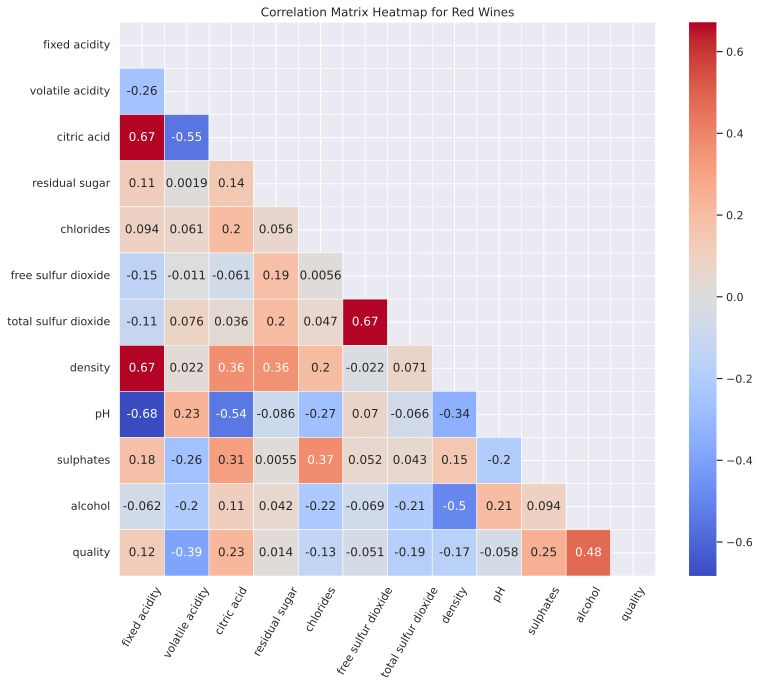

In [ ]:
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix_red, annot=True, cmap='coolwarm', linewidths=0.5, mask=mask1)
plt.title('Correlation Matrix Heatmap for Red Wines')
plt.xticks(rotation=60)
plt.show()

Бачимо строгу позитивну кореляцію '**quality**' з '**alcohol**'  та '**volatile acidity**' має міцну негативну кореляцію з '**quality**'.

In [ ]:
# Read the second dataset with white wines
whitewine_data = pd.read_csv('/content/drive/MyDrive/Datasets/wines/winequality-white.csv', delimiter=';')
whitewine_data.head(3)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6


In [ ]:
# Check quantity, type of data and empty positions in the columns of the dataset
whitewine_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4898 entries, 0 to 4897
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         4898 non-null   float64
 1   volatile acidity      4898 non-null   float64
 2   citric acid           4898 non-null   float64
 3   residual sugar        4898 non-null   float64
 4   chlorides             4898 non-null   float64
 5   free sulfur dioxide   4898 non-null   float64
 6   total sulfur dioxide  4898 non-null   float64
 7   density               4898 non-null   float64
 8   pH                    4898 non-null   float64
 9   sulphates             4898 non-null   float64
 10  alcohol               4898 non-null   float64
 11  quality               4898 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 459.3 KB


Тут теж всі 12 колонок мають числові дані та датасет не має пропусків даних. Даних тут в 3 рази більше ніж в попередньому датасеті, а власне 4989 спостережень.

In [ ]:
# Check stats information of the dataset
whitewine_data.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000
mean,6.854788,0.278241,0.334192,6.391415,0.045772,35.308085,138.360657,0.994027,3.188267,0.489847,10.514267,5.877909
std,0.843868,0.100795,0.121020,5.072058,0.021848,17.007137,42.498065,0.002991,0.151001,0.114126,1.230621,0.885639
min,3.800000,0.080000,0.000000,0.600000,0.009000,2.000000,9.000000,0.987110,2.720000,0.220000,8.000000,3.000000
25%,6.300000,0.210000,0.270000,1.700000,0.036000,23.000000,108.000000,0.991723,3.090000,0.410000,9.500000,5.000000
50%,6.800000,0.260000,0.320000,5.200000,0.043000,34.000000,134.000000,0.993740,3.180000,0.470000,10.400000,6.000000
75%,7.300000,0.320000,0.390000,9.900000,0.050000,46.000000,167.000000,0.996100,3.280000,0.550000,11.400000,6.000000
max,14.200000,1.100000,1.660000,65.800000,0.346000,289.000000,440.000000,1.038980,3.820000,1.080000,14.200000,9.000000


In [ ]:
# Make a correlation matrix and visualize possible correlations between all columns
correlation_matrix_white = whitewine_data.corr()
mask2 = np.triu(correlation_matrix_white)

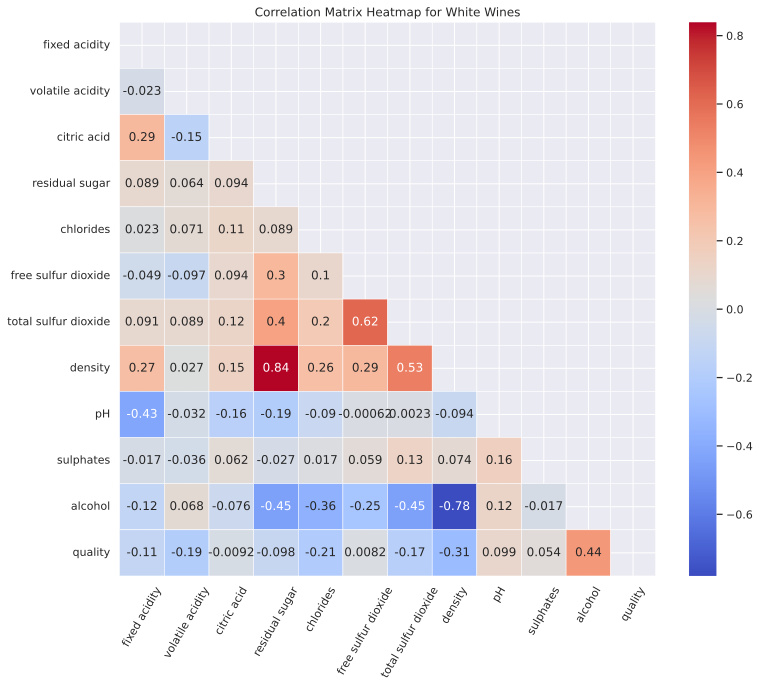

In [ ]:
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix_white, annot=True, cmap='coolwarm', linewidths=0.5, mask=mask2)
plt.title('Correlation Matrix Heatmap for White Wines')
plt.xticks(rotation=60)
plt.show()

* Бачимо строгу позитивну кореляцію '**quality**' з '**alcohol**', та досить міцну від'ємну кореляцію з '**density**'.
* Для подальшої роботи виберемо датасет білих вин

In [ ]:
# Let's visualize relationship between all features in white wines
sns.pairplot(whitewine_data.sample(frac=0.2, random_state=42), corner=True, kind='reg', diag_kind='kde');

На цій зведеній таблиці графиків датасету білих вин, можна перевірити позитивну чи негативну кореляцію між признаками, або її відстуність, крім цього ми бачимо що такі признаки як наприклад: '**ph**', '**sulphates**' мають нормальний розподіл з незначними викидами. А такі  признаки як '**free sulfur dioxide**' та '**chlorides**' сильно перекошені ліворуч, так як ці признаки мають дуже великі викиди - слід спробувати поекспериментувати з тим щоби позбутися ціх викідів при побудові моделі.

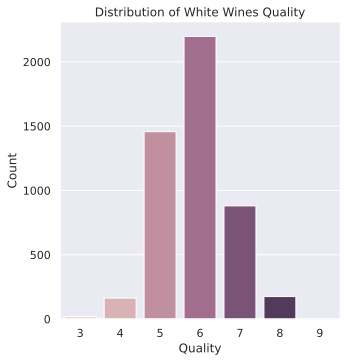

In [ ]:
# Visualize quality distribution in white wines
sns.catplot(x='quality', hue='quality', kind='count', data=whitewine_data, legend=False)
plt.title('Distribution of White Wines Quality')
plt.xlabel('Quality')
plt.ylabel('Count');

Найбільше ми маємо вин з якістю 5, 6 та 7. Інформації про віна якістю 3, 4, 8, 9 мало. Наш датасет не збалансований, але будемо працювати з тим що є.

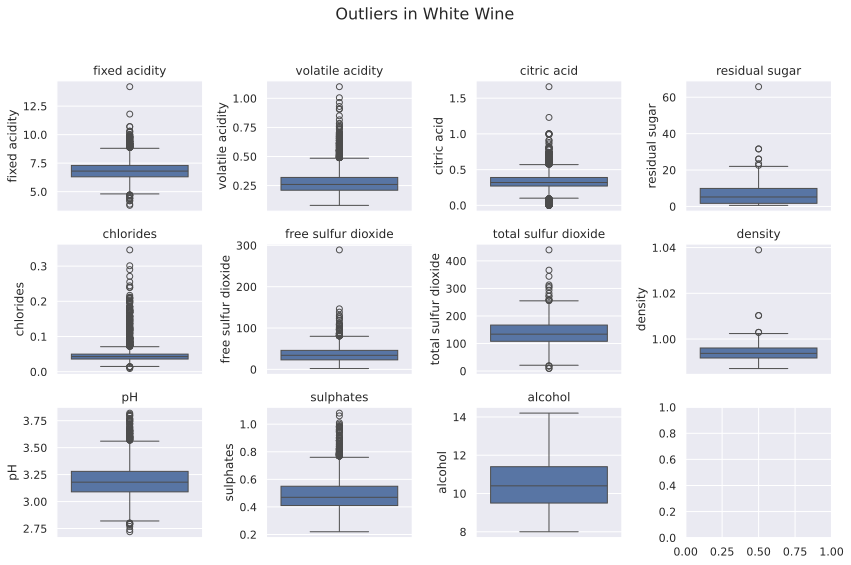

In [ ]:
# We have came to conclusion that some of the features have outliers.
# Let's check both datasets whether they have big outliers
columns = whitewine_data.columns[:-1]  # Excluding 'quality'

# Set up the figure for white wines plots
fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(12, 8))
fig.suptitle('Outliers in White Wine', fontsize=16)

# Generate box plots for each column in the white wine dataset
for i, col in enumerate(columns):
    sns.boxplot(y=whitewine_data[col], ax=axes[i//4, i%4])
    axes[i//4, i%4].set_title(col)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

Багато признаків, такі як **chlorides**, **total sulfur dioxide**, та **residual sugar**, мають дуже великі викиди в обидвух датасетах.

## **2. Clean Data**

In [ ]:
# Remove all outliers from both datasets using interquartile range - IQR
# Calculate IQR and find lower and upper bounds
def remove_outliers(data_df):
    Q1 = data_df.quantile(0.25)
    Q3 = data_df.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return data_df[~((data_df < (lower_bound)) | (data_df > (upper_bound))).any(axis=1)]

# Apply the function to remove outliers
whitewine_data_clean = remove_outliers(whitewine_data[columns])

# Add excluded column to the new datasets
whitewine_data_clean['quality'] = whitewine_data['quality']

# Recalculate correlation
whitewine_corr_clean = whitewine_data_clean[columns].corr()

**Ми видалили викиди і створили новий датасет для наших подальших експериментів з моделлю регресії**

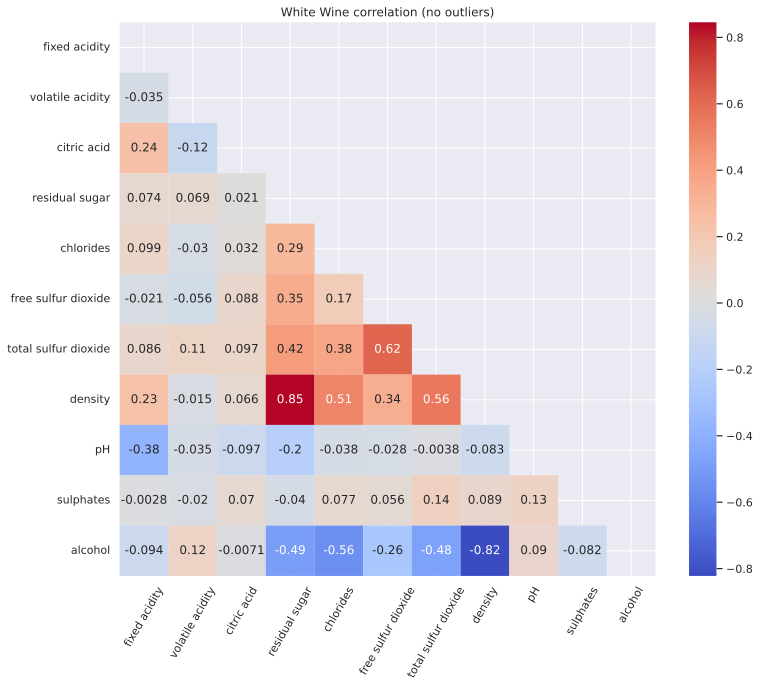

In [ ]:
# Visualize
plt.figure(figsize=(12, 10))

# Create new heatmaps
mask4 = np.triu(whitewine_corr_clean)
sns.heatmap(whitewine_corr_clean, annot=True, cmap='coolwarm', mask=mask4)
plt.title('White Wine correlation (no outliers)')
plt.xticks(rotation=60)
plt.show()

Якщо порівняти з попереднею матрицею, то побачимо що кореляція між некоторими признаками збільшилась

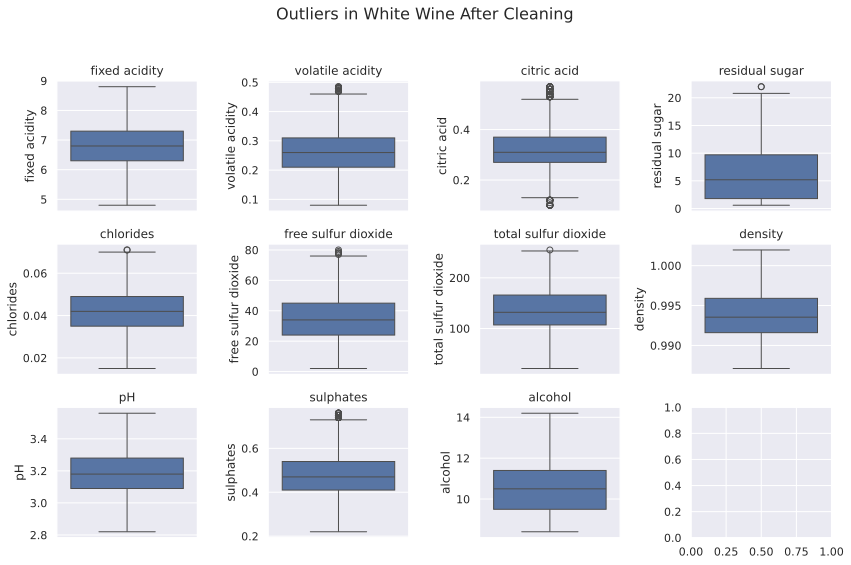

In [ ]:
# Set up the figure for white wines data
fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(12, 8))
fig.suptitle('Outliers in White Wine After Cleaning', fontsize=16)

# Generate box plots for each column in the white wine dataset
for i, col in enumerate(columns):
    sns.boxplot(y=whitewine_data_clean[col], ax=axes[i//4, i%4])
    axes[i//4, i%4].set_title(col)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

In [ ]:
print(f" We have now {whitewine_data_clean.shape[0]} lines of observations, \
we have removed approx 870 observations with outliers")

 We have now 4015 lines of observations, we have removed approx 870 observations with outliers


In [ ]:
# Додамо новий признак total_acidity
whitewine_data['total_acidity'] = whitewine_data['fixed acidity'] + whitewine_data['volatile acidity']
whitewine_data_clean['total_acidity'] = whitewine_data_clean['fixed acidity'] + whitewine_data_clean['volatile acidity']

## **3. Build Models**

In [ ]:
# 1. Prepare the data and target
# 1.1. Scaling
# 1.2. Stratification (try)
# 1.4. Crossvalidation
# 2. Build default model and model with GridSearch
# 4. Evaluate the model: MSE
# 5. Try another model - RandomForest for instance

### 3.1. Scaling and splitting dataset

In [ ]:
columns_to_drop = ['quality', 'citric acid', 'total sulfur dioxide']  # remove columns that have no correlation with target

# Scale data with StandardScaler
scaler = StandardScaler()
scaled_features = scaler.fit_transform(whitewine_data_clean.drop(columns=columns_to_drop, axis=1))

X = scaled_features
y = whitewine_data_clean['quality']

# Split data into train (70%), validation (20%), and test (10%) sets
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42) # stratify=y - stratification deteriorates MSE for a few points
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.33, random_state=42)

# Print result of splitting data
print(f'Train size: {X_train.shape[0]}, Validation size: {X_val.shape[0]}, Test size: {X_test.shape[0]}')

Train size: 2810, Validation size: 807, Test size: 398


### 3.2. Build Default Linear Regression Model for white wines

In [ ]:
# Train LinearRegression model and evaluate it with MSE metric
lr_model = LinearRegression()
lr_model.fit(X_train, y_train)

# Predict and evaluate on validation set
y_val_pred = lr_model.predict(X_val)
mse_val = mean_squared_error(y_val, y_val_pred)
print(f"Linear Regression MSE on Validation Set: {mse_val}")

Linear Regression MSE on Validation Set: 0.5895784751454773


In [ ]:
# Apply crossvalidation to the datasets
cv_scores = cross_val_score(lr_model, X_train, y_train, cv=5)

# Fit model
lr_model.fit(X_train, y_train)

# Compare
train_score = lr_model.score(X_train, y_train)
test_score = lr_model.score(X_val, y_val)

# Five folds to be processed
print(f"Cross-Validation Scores: {cv_scores}")
print(f"Train Score: {train_score}")
print(f"Test Score: {test_score}")

Cross-Validation Scores: [0.24968104 0.20679034 0.210801   0.28751612 0.2674067 ]
Train Score: 0.2559117795350956
Test Score: 0.22092193368256585


The difference between folds too big - sometimes it equals to 40%. Probably we need more cleaning of the dataset, or balance our target data - there is only 4 observations for 'quality' = 9 for example

### 3.3. Build LinearRegression Model with GridSearchCV for white wines

In [ ]:
# Define pipeline for polynomial features and linear regression
pipeline = Pipeline([
    ('poly', PolynomialFeatures()),
    ('linear', LinearRegression())
])

# Define parameters for GridSearchCV
param_grid_lr = {
    'poly__degree': [1, 2, 3],
    'linear__fit_intercept': [True, False],
    'linear__copy_X': [True, False]
}

grid_search_lr = GridSearchCV(estimator=pipeline, param_grid=param_grid_lr, cv=3,
                              scoring='neg_mean_squared_error', n_jobs=-1)

# Fit GridSearchCV on the training data
grid_search_lr.fit(X_train, y_train)
best_params_lr = grid_search_lr.best_params_

# Train the best model
best_lr_model = grid_search_lr.best_estimator_

# Predict and evaluate -> validation set
y_val_pred_lr = best_lr_model.predict(X_val)
mse_val_lr = mean_squared_error(y_val, y_val_pred_lr)

# Evaluate on test set
y_test_pred_lr = best_lr_model.predict(X_test)
mse_test_lr = mean_squared_error(y_test, y_test_pred_lr)

# Print results
print("Best Params for Linear Regression:", best_params_lr)
print("Linear Regression MSE on Validation Set:", mse_val_lr)
print("Linear Regression MSE on Test Set:", mse_test_lr)

Best Params for Linear Regression: {'linear__copy_X': True, 'linear__fit_intercept': True, 'poly__degree': 2}
Linear Regression MSE on Validation Set: 0.5395059539674005
Linear Regression MSE on Test Set: 0.42265010771871514


* **Best Params** for Linear Regression: {'linear__copy_X': True, 'linear__fit_intercept': True, 'poly__degree': 2}
* Linear Regression MSE on Validation Set: **0.5395059539674005**
* Linear Regression MSE on Test Set: **0.42265010771871514**

We have obtained best parameters for our model and MSE metric is better than previous default model.

### 3.4. Build RandomForest Model with GridSearchCV for white wines

In [ ]:
# Arrange another model - RandomForest with hyperparameters based on GridSearchCV
# with the purpose to compare its accuarcy with Linear Regression model

# Define the parameters for GridSearchCV
param_grid = {
    'n_estimators': [300, 400, 500, 700],
    'max_depth': [None, 2, 5],
    'min_samples_split': [2, 3, 5],
    'max_features': ['auto', 'sqrt', 'log2']
}

# Create the model
rf_model = RandomForestRegressor(random_state=42)
grid_search = GridSearchCV(estimator=rf_model, param_grid=param_grid, cv=3,
                           scoring='neg_mean_squared_error', n_jobs=-1)
# Fit on train data
grid_search.fit(X_train, y_train)
best_params = grid_search.best_params_

# Train the best model
best_rf_model = grid_search.best_estimator_

# Predict and evaluate on validation set
y_val_pred_rf = best_rf_model.predict(X_val)
mse_val_rf = mean_squared_error(y_val, y_val_pred_rf)

# Evaluate on test set
y_test_pred_rf = best_rf_model.predict(X_test)
mse_test_rf = mean_squared_error(y_test, y_test_pred_rf)

# Print results
print("Best Params:", best_params)
print("Random Forest MSE on Validation Set:", mse_val_rf)
print("Random Forest MSE on Test Set:", mse_test_rf)

Best Params: {'max_depth': None, 'max_features': 'sqrt', 'min_samples_split': 2, 'n_estimators': 400}
Random Forest MSE on Validation Set: 0.4135901641883519
Random Forest MSE on Test Set: 0.3173983668341709


* Best Params: {**'max_depth': None, 'min_samples_split': 2, 'n_estimators': 400**}
* Random Forest MSE on Validation Set: **0.4232219330855019**
* Random Forest MSE on Test Set: **0.32950274811557795**

The Random Forest model shows significantly better accuracy than Linear Regression

################ END OF NOTEBOOK ###################